## YELP

# 1. Importing libraries

In [1]:
!pip install -q shap
!pip install -q phik

In [2]:
PYDEVD_DISABLE_FILE_VALIDATION=1
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
import shap
# загружаем класс pipeline
from sklearn.pipeline import Pipeline

# загружаем классы для подготовки данных
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder, StandardScaler, MinMaxScaler, RobustScaler, LabelEncoder
from sklearn.compose import ColumnTransformer

# загружаем класс для работы с пропусками
from sklearn.impute import SimpleImputer

# загружаем функцию для работы с метриками
from sklearn.metrics import roc_auc_score

# импортируем класс RandomizedSearchCV
from sklearn.model_selection import RandomizedSearchCV

# загружаем нужные модели
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC

import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, confusion_matrix, accuracy_score, recall_score, precision_score
import phik
import warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', None) 

from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA
import folium
from folium.plugins import MarkerCluster

In [3]:
# yelp_business_hours = pd.read_csv('Yelp/yelp_business_hours.csv')
yelp_business = pd.read_csv('Yelp/yelp_business.csv')
# yelp_checkin = pd.read_csv('Yelp/yelp_checkin.csv') 
# yelp_review = pd.read_csv('Yelp/yelp_review.csv')
# yelp_tip = pd.read_csv('Yelp/yelp_tip.csv')
yelp_user = pd.read_csv('Yelp/yelp_user.csv')

# 2. Data Overview

In [4]:
yelp_business.head()

,business_id,name,neighborhood,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,categories
0,FYWN1wneV18bWNgQjJ2GNg,"""Dental by Design""",NaN,"""4855 E Warner Rd, Ste B9""",Ahwatukee,AZ,85044,33.330690,-111.978599,4.0,22,1,Dentists;General Dentistry;Health & Medical;Or...
1,He-G7vWjzVUysIKrfNbPUQ,"""Stephen Szabo Salon""",NaN,"""3101 Washington Rd""",McMurray,PA,15317,40.291685,-80.104900,3.0,11,1,Hair Stylists;Hair Salons;Men's Hair Salons;Bl...
2,KQPW8lFf1y5BT2MxiSZ3QA,"""Western Motor Vehicle""",NaN,"""6025 N 27th Ave, Ste 1""",Phoenix,AZ,85017,33.524903,-112.115310,1.5,18,1,Departments of Motor Vehicles;Public Services ...
3,8DShNS-LuFqpEWIp0HxijA,"""Sports Authority""",NaN,"""5000 Arizona Mills Cr, Ste 435""",Tempe,AZ,85282,33.383147,-111.964725,3.0,9,0,Sporting Goods;Shopping
4,PfOCPjBrlQAnz__NXj9h_w,"""Brick House Tavern + Tap""",NaN,"""581 Howe Ave""",Cuyahoga Falls,OH,44221,41.119535,-81.475690,3.5,116,1,American (New);Nightlife;Bars;Sandwiches;Ameri...


In [5]:
yelp_business.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 174567 entries, 0 to 174566
Data columns (total 13 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   business_id   174567 non-null  object 
 1   name          174567 non-null  object 
 2   neighborhood  68015 non-null   object 
 3   address       174567 non-null  object 
 4   city          174566 non-null  object 
 5   state         174566 non-null  object 
 6   postal_code   173944 non-null  object 
 7   latitude      174566 non-null  float64
 8   longitude     174566 non-null  float64
 9   stars         174567 non-null  float64
 10  review_count  174567 non-null  int64  
 11  is_open       174567 non-null  int64  
 12  categories    174567 non-null  object 
dtypes: float64(3), int64(2), object(8)
memory usage: 17.3+ MB


In [6]:
yelp_user.head()

,user_id,name,review_count,yelping_since,friends,useful,funny,cool,fans,elite,average_stars,compliment_hot,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
0,JJ-aSuM4pCFPdkfoZ34q0Q,Chris,10,2013-09-24,"0njfJmB-7n84DlIgUByCNw, rFn3Xe3RqHxRSxWOU19Gpg...",0,0,0,0,NaN,3.70,0,0,0,0,0,0,0,0,0,0,0
1,uUzsFQn_6cXDh6rPNGbIFA,Tiffy,1,2017-03-02,NaN,0,0,0,0,NaN,2.00,0,0,0,0,0,0,0,0,0,0,0
2,mBneaEEH5EMyxaVyqS-72A,Mark,6,2015-03-13,NaN,0,0,0,0,NaN,4.67,0,0,0,0,0,0,0,0,0,0,0
3,W5mJGs-dcDWRGEhAzUYtoA,Evelyn,3,2016-09-08,NaN,0,0,0,0,NaN,4.67,0,0,0,0,0,0,0,0,0,0,0
4,4E8--zUZO1Rr1IBK4_83fg,Lisa,11,2012-07-16,NaN,4,0,0,0,NaN,3.45,0,0,0,0,0,0,0,0,0,1,0


In [7]:
yelp_user.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1326100 entries, 0 to 1326099
Data columns (total 22 columns):
 #   Column              Non-Null Count    Dtype  
---  ------              --------------    -----  
 0   user_id             1326100 non-null  object 
 1   name                1325585 non-null  object 
 2   review_count        1326100 non-null  int64  
 3   yelping_since       1326100 non-null  object 
 4   friends             760007 non-null   object 
 5   useful              1326100 non-null  int64  
 6   funny               1326100 non-null  int64  
 7   cool                1326100 non-null  int64  
 8   fans                1326100 non-null  int64  
 9   elite               60818 non-null    object 
 10  average_stars       1326100 non-null  float64
 11  compliment_hot      1326100 non-null  int64  
 12  compliment_more     1326100 non-null  int64  
 13  compliment_profile  1326100 non-null  int64  
 14  compliment_cute     1326100 non-null  int64  
 15  compliment_list

# 3. Data Preprocessing

### yelp_business.csv

In [8]:
yelp_business.head()

,business_id,name,neighborhood,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,categories
0,FYWN1wneV18bWNgQjJ2GNg,"""Dental by Design""",NaN,"""4855 E Warner Rd, Ste B9""",Ahwatukee,AZ,85044,33.330690,-111.978599,4.0,22,1,Dentists;General Dentistry;Health & Medical;Or...
1,He-G7vWjzVUysIKrfNbPUQ,"""Stephen Szabo Salon""",NaN,"""3101 Washington Rd""",McMurray,PA,15317,40.291685,-80.104900,3.0,11,1,Hair Stylists;Hair Salons;Men's Hair Salons;Bl...
2,KQPW8lFf1y5BT2MxiSZ3QA,"""Western Motor Vehicle""",NaN,"""6025 N 27th Ave, Ste 1""",Phoenix,AZ,85017,33.524903,-112.115310,1.5,18,1,Departments of Motor Vehicles;Public Services ...
3,8DShNS-LuFqpEWIp0HxijA,"""Sports Authority""",NaN,"""5000 Arizona Mills Cr, Ste 435""",Tempe,AZ,85282,33.383147,-111.964725,3.0,9,0,Sporting Goods;Shopping
4,PfOCPjBrlQAnz__NXj9h_w,"""Brick House Tavern + Tap""",NaN,"""581 Howe Ave""",Cuyahoga Falls,OH,44221,41.119535,-81.475690,3.5,116,1,American (New);Nightlife;Bars;Sandwiches;Ameri...


In [9]:
yelp_business.isna().sum()

business_id          0
name                 0
neighborhood    106552
address              0
city                 1
state                1
postal_code        623
latitude             1
longitude            1
stars                0
review_count         0
is_open              0
categories           0
dtype: int64

In [10]:
yelp_business['neighborhood'] = yelp_business['neighborhood'] .fillna('Unknown')

In [11]:
yelp_business = yelp_business.dropna()

In [12]:
yelp_business.isna().sum()

business_id     0
name            0
neighborhood    0
address         0
city            0
state           0
postal_code     0
latitude        0
longitude       0
stars           0
review_count    0
is_open         0
categories      0
dtype: int64

In [13]:
yelp_business['postal_code'] = yelp_business['postal_code'].str.replace(r'\D', '', regex=True)
yelp_business['postal_code'] = yelp_business['postal_code'].astype(int)

# Verify the changes
yelp_business.info()

<class 'pandas.core.frame.DataFrame'>
Index: 173941 entries, 0 to 174566
Data columns (total 13 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   business_id   173941 non-null  object 
 1   name          173941 non-null  object 
 2   neighborhood  173941 non-null  object 
 3   address       173941 non-null  object 
 4   city          173941 non-null  object 
 5   state         173941 non-null  object 
 6   postal_code   173941 non-null  int64  
 7   latitude      173941 non-null  float64
 8   longitude     173941 non-null  float64
 9   stars         173941 non-null  float64
 10  review_count  173941 non-null  int64  
 11  is_open       173941 non-null  int64  
 12  categories    173941 non-null  object 
dtypes: float64(3), int64(3), object(7)
memory usage: 18.6+ MB


In [14]:
np.set_printoptions(threshold=np.inf)
# print(yelp_business.city.unique())

### yelp_user.csv

In [15]:
yelp_user.replace('None', np.nan, inplace=True)
yelp_user.head()

,user_id,name,review_count,yelping_since,friends,useful,funny,cool,fans,elite,average_stars,compliment_hot,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
0,JJ-aSuM4pCFPdkfoZ34q0Q,Chris,10,2013-09-24,"0njfJmB-7n84DlIgUByCNw, rFn3Xe3RqHxRSxWOU19Gpg...",0,0,0,0,NaN,3.70,0,0,0,0,0,0,0,0,0,0,0
1,uUzsFQn_6cXDh6rPNGbIFA,Tiffy,1,2017-03-02,NaN,0,0,0,0,NaN,2.00,0,0,0,0,0,0,0,0,0,0,0
2,mBneaEEH5EMyxaVyqS-72A,Mark,6,2015-03-13,NaN,0,0,0,0,NaN,4.67,0,0,0,0,0,0,0,0,0,0,0
3,W5mJGs-dcDWRGEhAzUYtoA,Evelyn,3,2016-09-08,NaN,0,0,0,0,NaN,4.67,0,0,0,0,0,0,0,0,0,0,0
4,4E8--zUZO1Rr1IBK4_83fg,Lisa,11,2012-07-16,NaN,4,0,0,0,NaN,3.45,0,0,0,0,0,0,0,0,0,1,0


In [16]:
yelp_user.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1326100 entries, 0 to 1326099
Data columns (total 22 columns):
 #   Column              Non-Null Count    Dtype  
---  ------              --------------    -----  
 0   user_id             1326100 non-null  object 
 1   name                1325585 non-null  object 
 2   review_count        1326100 non-null  int64  
 3   yelping_since       1326100 non-null  object 
 4   friends             760007 non-null   object 
 5   useful              1326100 non-null  int64  
 6   funny               1326100 non-null  int64  
 7   cool                1326100 non-null  int64  
 8   fans                1326100 non-null  int64  
 9   elite               60818 non-null    object 
 10  average_stars       1326100 non-null  float64
 11  compliment_hot      1326100 non-null  int64  
 12  compliment_more     1326100 non-null  int64  
 13  compliment_profile  1326100 non-null  int64  
 14  compliment_cute     1326100 non-null  int64  
 15  compliment_list

In [17]:
yelp_user.isna().sum()

user_id                     0
name                      515
review_count                0
yelping_since               0
friends                566093
useful                      0
funny                       0
cool                        0
fans                        0
elite                 1265282
average_stars               0
compliment_hot              0
compliment_more             0
compliment_profile          0
compliment_cute             0
compliment_list             0
compliment_note             0
compliment_plain            0
compliment_cool             0
compliment_funny            0
compliment_writer           0
compliment_photos           0
dtype: int64

In [18]:
yelp_user['yelping_since'] = pd.to_datetime(yelp_user['yelping_since'])

In [19]:
yelp_user.duplicated().sum()

0

# 4. Exploratory Data Analysis

In [20]:
print(yelp_business.head())

              business_id                        name neighborhood  \
0  FYWN1wneV18bWNgQjJ2GNg          "Dental by Design"      Unknown   
1  He-G7vWjzVUysIKrfNbPUQ       "Stephen Szabo Salon"      Unknown   
2  KQPW8lFf1y5BT2MxiSZ3QA     "Western Motor Vehicle"      Unknown   
3  8DShNS-LuFqpEWIp0HxijA          "Sports Authority"      Unknown   
4  PfOCPjBrlQAnz__NXj9h_w  "Brick House Tavern + Tap"      Unknown   

                            address            city state  postal_code  \
0        "4855 E Warner Rd, Ste B9"       Ahwatukee    AZ        85044   
1              "3101 Washington Rd"        McMurray    PA        15317   
2          "6025 N 27th Ave, Ste 1"         Phoenix    AZ        85017   
3  "5000 Arizona Mills Cr, Ste 435"           Tempe    AZ        85282   
4                    "581 Howe Ave"  Cuyahoga Falls    OH        44221   

    latitude   longitude  stars  review_count  is_open  \
0  33.330690 -111.978599    4.0            22        1   
1  40.291685  -80.

In [21]:
yelp_business.describe()

,postal_code,latitude,longitude,stars,review_count,is_open
count,1.739410e+05,173941.000000,173941.000000,173941.000000,173941.000000,173941.000000
mean,5.219505e+04,38.630189,-92.676416,3.632367,30.213653,0.840055
std,3.852896e+04,5.365596,26.241324,1.002497,98.372882,0.366556
min,0.000000e+00,-36.086009,-142.466650,1.000000,3.000000,0.000000
25%,1.506800e+04,33.632069,-112.125856,3.000000,4.000000,1.000000
50%,7.019300e+04,36.144154,-89.409206,3.500000,8.000000,1.000000
75%,8.529500e+04,43.604713,-79.660902,4.500000,23.000000,1.000000
max,2.480000e+06,89.999314,115.086769,5.000000,7361.000000,1.000000


In [22]:
num_cols = ['postal_code', 'latitude', 'longitude', 'stars', 'review_count']
(
    yelp_business[num_cols]
    .quantile([0.0012, 0.01, .5, .99, .9988]) # выбираем размах в 0,9976 квантилей 
    .style.format("{:,.2f}")
)

,postal_code,latitude,longitude,stars,review_count
0.001200,2.00,33.22,-115.34,1.00,3.00
0.010000,10.00,33.29,-115.30,1.00,3.00
0.500000,"70,193.00",36.14,-89.41,3.50,8.00
0.990000,"89,149.00",55.95,9.17,5.00,352.00
0.998800,"89,183.00",56.11,9.30,5.00,"1,079.54"


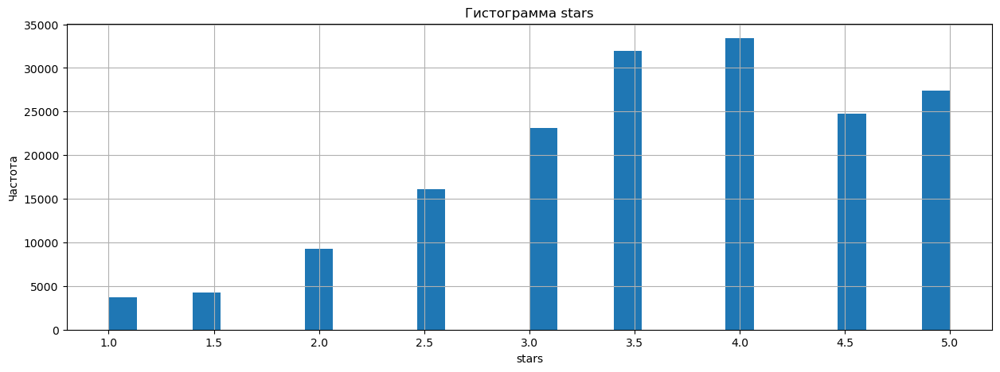

In [23]:
yelp_business['stars'].hist(bins=30, figsize=(15,5))
plt.title('Гистограмма stars')
plt.xlabel('stars')
plt.ylabel('Частота')
plt.show()

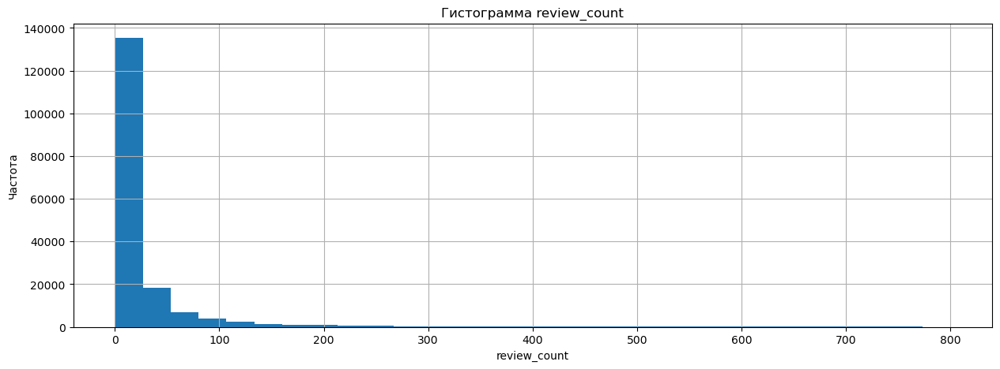

In [24]:
yelp_business['review_count'].hist(bins=30, figsize=(15,5), range=(0, 800))
plt.title('Гистограмма review_count')
plt.xlabel('review_count')
plt.ylabel('Частота')
plt.show()

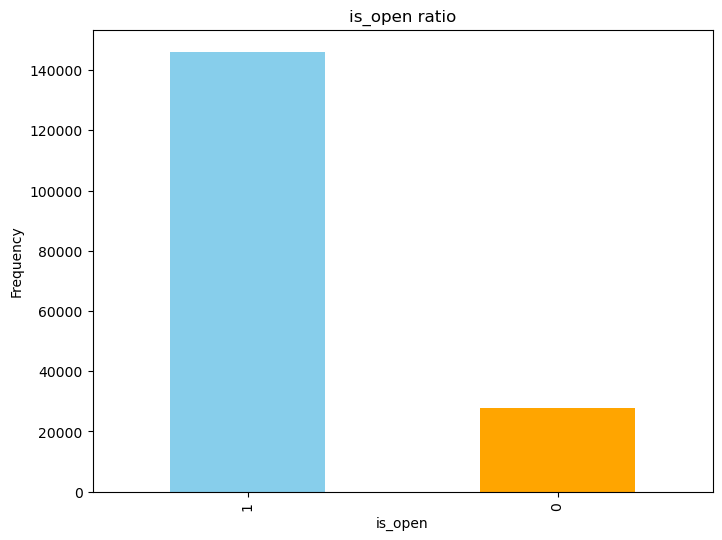

In [25]:
plt.figure(figsize=(8, 6))
yelp_business['is_open'].value_counts().plot(kind='bar', color=['skyblue', 'orange'])
plt.title('is_open ratio')
plt.ylabel('Frequency')
plt.show()

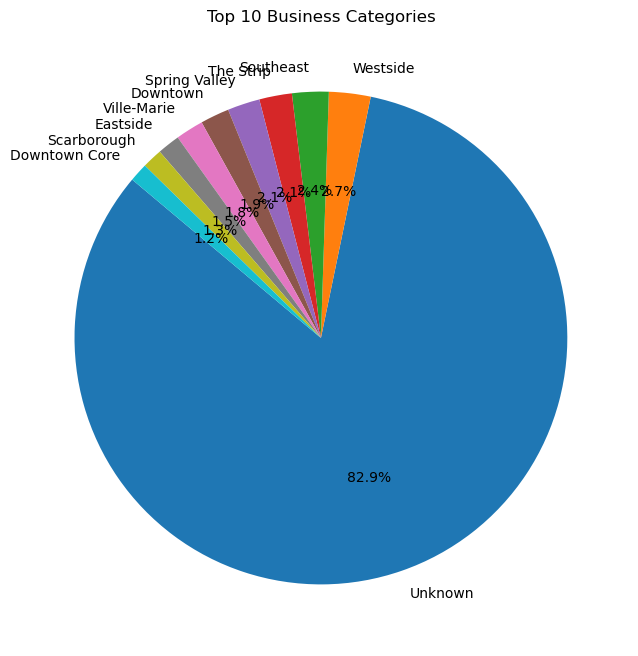

In [26]:
categories = yelp_business['neighborhood'].str.split(';')

flat_categories = [item.strip() for sublist in categories.dropna() for item in sublist]

category_counts = pd.Series(flat_categories).value_counts()

plt.figure(figsize=(8, 8))
category_counts.head(10).plot(kind='pie', autopct='%1.1f%%', startangle=140)
plt.title('Top 10 Business Categories')
plt.ylabel('')
plt.show()

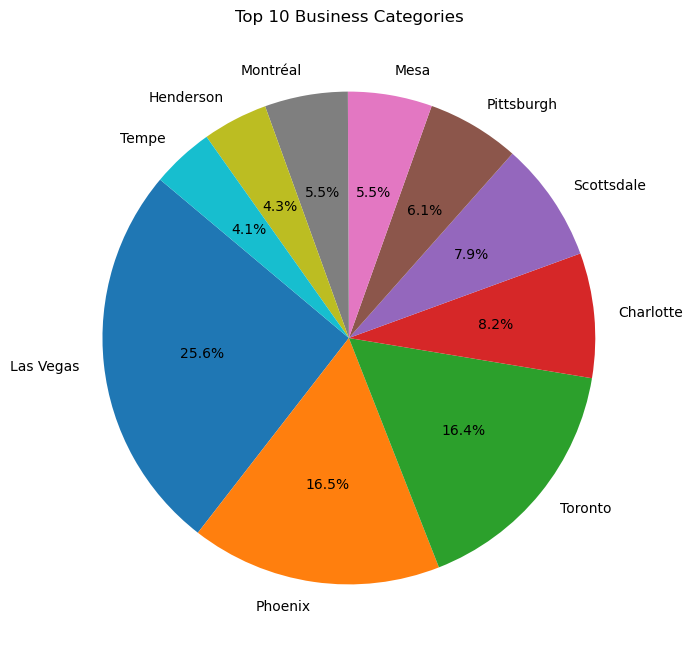

In [27]:
categories = yelp_business['city'].str.split(';')

flat_categories = [item.strip() for sublist in categories.dropna() for item in sublist]

category_counts = pd.Series(flat_categories).value_counts()

plt.figure(figsize=(8, 8))
category_counts.head(10).plot(kind='pie', autopct='%1.1f%%', startangle=140)
plt.title('Top 10 Business Categories')
plt.ylabel('')
plt.show()

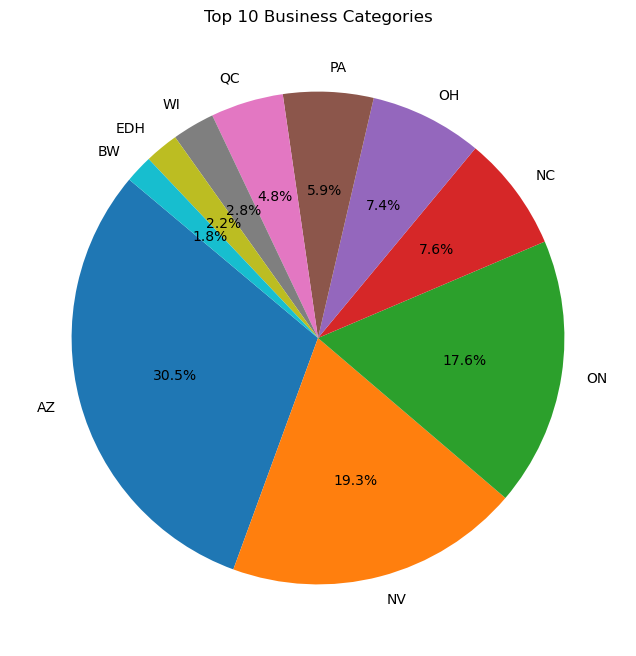

In [28]:
categories = yelp_business['state'].str.split(';')

flat_categories = [item.strip() for sublist in categories.dropna() for item in sublist]

category_counts = pd.Series(flat_categories).value_counts()

plt.figure(figsize=(8, 8))
category_counts.head(10).plot(kind='pie', autopct='%1.1f%%', startangle=140)
plt.title('Top 10 Business Categories')
plt.ylabel('')
plt.show()

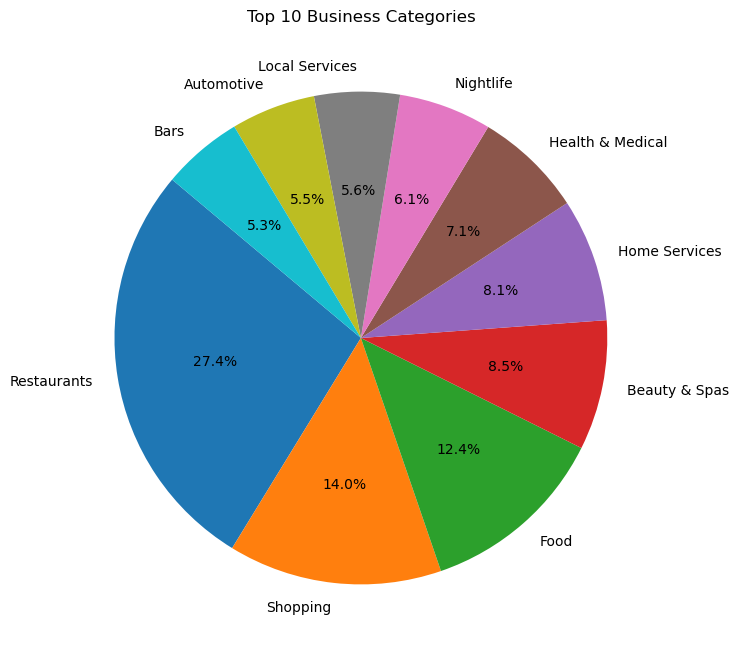

In [29]:
categories = yelp_business['categories'].str.split(';')

flat_categories = [item.strip() for sublist in categories.dropna() for item in sublist]

category_counts = pd.Series(flat_categories).value_counts()

plt.figure(figsize=(8, 8))
category_counts.head(10).plot(kind='pie', autopct='%1.1f%%', startangle=140)
plt.title('Top 10 Business Categories')
plt.ylabel('')
plt.show()

In [30]:
category_counts.head(20)

Restaurants                  54517
Shopping                     27935
Food                         24635
Beauty & Spas                16981
Home Services                16080
Health & Medical             14217
Nightlife                    12136
Local Services               11171
Automotive                   11028
Bars                         10554
Event Planning & Services     9024
Active Life                   8213
Fashion                       7016
Sandwiches                    6337
Fast Food                     6273
Hair Salons                   6127
American (Traditional)        6091
Pizza                         6063
Coffee & Tea                  5923
Hotels & Travel               5687
Name: count, dtype: int64

# 5. Correlation Analysis

In [31]:
yelp_target = yelp_business[(yelp_business['state'] == 'PA')]
yelp_target.info()

<class 'pandas.core.frame.DataFrame'>
Index: 10091 entries, 1 to 174565
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   business_id   10091 non-null  object 
 1   name          10091 non-null  object 
 2   neighborhood  10091 non-null  object 
 3   address       10091 non-null  object 
 4   city          10091 non-null  object 
 5   state         10091 non-null  object 
 6   postal_code   10091 non-null  int64  
 7   latitude      10091 non-null  float64
 8   longitude     10091 non-null  float64
 9   stars         10091 non-null  float64
 10  review_count  10091 non-null  int64  
 11  is_open       10091 non-null  int64  
 12  categories    10091 non-null  object 
dtypes: float64(3), int64(3), object(7)
memory usage: 1.1+ MB


In [32]:
def filter_categories(data, category_counts):
    categories_split = data['categories'].str.split(';')
    filtered_categories = []

    for category_list in categories_split:
        category_count = {}
        for category in category_list:
            if category in category_counts:
                category_count[category] = category_counts[category]
        if not category_count:
            filtered_categories.append(None)
            continue

        # Select the most popular category based on the priority order
        primary_category = max(category_count, key=category_count.get)
        filtered_categories.append(primary_category)

    # Add the filtered categories as a new column to the dataframe
    data['filtered_categories'] = filtered_categories

    return data

# Example usage
# Assuming you have loaded your dataset into a DataFrame named 'yelp_business'
# and 'category_counts' is a pandas Series containing the category counts
# with the categories as the index and counts as the values
# You can call the function like this:
yelp_target = filter_categories(yelp_target, category_counts)
yelp_target.head()

,business_id,name,neighborhood,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,categories,filtered_categories
1,He-G7vWjzVUysIKrfNbPUQ,"""Stephen Szabo Salon""",Unknown,"""3101 Washington Rd""",McMurray,PA,15317,40.291685,-80.104900,3.0,11,1,Hair Stylists;Hair Salons;Men's Hair Salons;Bl...,Beauty & Spas
8,EsMcGiZaQuG1OOvL9iUFug,"""Any Given Sundae""",Unknown,"""2612 Brandt School Rd""",Wexford,PA,15090,40.615102,-80.091349,5.0,15,1,Coffee & Tea;Ice Cream & Frozen Yogurt;Food,Food
10,XOSRcvtaKc_Q5H1SAzN20A,"""East Coast Coffee""",Unknown,"""737 West Pike St""",Houston,PA,15342,40.241548,-80.212815,4.5,3,0,Breakfast & Brunch;Gluten-Free;Coffee & Tea;Fo...,Restaurants
13,NmZtoE3v8RdSJEczYbMT9g,"""Complete Dental Care""",Unknown,"""107 Whitaker Str""",Homestead,PA,15120,40.401488,-79.887916,2.0,5,1,General Dentistry;Dentists;Endodontists;Cosmet...,Health & Medical
44,BnuzcebyB1AfxH0kjNWqSg,"""Carrabba's Italian Grill""",Unknown,"""245 Lancaster Ave""",Frazer,PA,19355,40.041003,-75.542497,3.5,25,0,Restaurants;Italian;Seafood,Restaurants


In [33]:
yelp_target.drop('categories', axis=1, inplace=True)


In [34]:
yelp_target.head()

,business_id,name,neighborhood,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,filtered_categories
1,He-G7vWjzVUysIKrfNbPUQ,"""Stephen Szabo Salon""",Unknown,"""3101 Washington Rd""",McMurray,PA,15317,40.291685,-80.104900,3.0,11,1,Beauty & Spas
8,EsMcGiZaQuG1OOvL9iUFug,"""Any Given Sundae""",Unknown,"""2612 Brandt School Rd""",Wexford,PA,15090,40.615102,-80.091349,5.0,15,1,Food
10,XOSRcvtaKc_Q5H1SAzN20A,"""East Coast Coffee""",Unknown,"""737 West Pike St""",Houston,PA,15342,40.241548,-80.212815,4.5,3,0,Restaurants
13,NmZtoE3v8RdSJEczYbMT9g,"""Complete Dental Care""",Unknown,"""107 Whitaker Str""",Homestead,PA,15120,40.401488,-79.887916,2.0,5,1,Health & Medical
44,BnuzcebyB1AfxH0kjNWqSg,"""Carrabba's Italian Grill""",Unknown,"""245 Lancaster Ave""",Frazer,PA,19355,40.041003,-75.542497,3.5,25,0,Restaurants


In [35]:
yelp_target_sub = yelp_target[['latitude', 'longitude', 'stars', 'review_count', 'is_open', 'filtered_categories', 'city']]
yelp_target_sub.head()

,latitude,longitude,stars,review_count,is_open,filtered_categories,city
1,40.291685,-80.104900,3.0,11,1,Beauty & Spas,McMurray
8,40.615102,-80.091349,5.0,15,1,Food,Wexford
10,40.241548,-80.212815,4.5,3,0,Restaurants,Houston
13,40.401488,-79.887916,2.0,5,1,Health & Medical,Homestead
44,40.041003,-75.542497,3.5,25,0,Restaurants,Frazer


In [36]:
# Define bounding box for Pennsylvania
min_lat, max_lat = 39.7, 42.3  # Latitude range for Pennsylvania
min_lon, max_lon = -80.7, -74.7  # Longitude range for Pennsylvania

# Filter the DataFrame to include only points within the bounding box
yelp_target_sub = yelp_target_sub[
    (yelp_target_sub['latitude'] >= min_lat) & (yelp_target_sub['latitude'] <= max_lat) &
    (yelp_target_sub['longitude'] >= min_lon) & (yelp_target_sub['longitude'] <= max_lon)
]

print(yelp_target_sub.head())

     latitude  longitude  stars  review_count  is_open filtered_categories  \
1   40.291685 -80.104900    3.0            11        1       Beauty & Spas   
8   40.615102 -80.091349    5.0            15        1                Food   
10  40.241548 -80.212815    4.5             3        0         Restaurants   
13  40.401488 -79.887916    2.0             5        1    Health & Medical   
44  40.041003 -75.542497    3.5            25        0         Restaurants   

         city  
1    McMurray  
8     Wexford  
10    Houston  
13  Homestead  
44     Frazer  


# 6. Model 

In [37]:
numerical_features = ['latitude', 'longitude', 'stars', 'review_count']
categorical_features = ['is_open', 'filtered_categories', 'city']

# Split the dataframe into numerical and categorical features
X_numerical = yelp_target_sub[numerical_features].values
X_categorical = yelp_target_sub[categorical_features].values

# Scale numerical features
scaler = StandardScaler()
X_numerical_scaled = scaler.fit_transform(X_numerical)

# One-hot encode categorical features
encoder = OneHotEncoder(sparse=False)
X_categorical_encoded = encoder.fit_transform(X_categorical)

# Concatenate scaled numerical features and encoded categorical features
X_scaled = np.concatenate((X_numerical_scaled, X_categorical_encoded), axis=1)

Optimal number of clusters: 2
Corresponding silhouette score: 0.7910346456129149


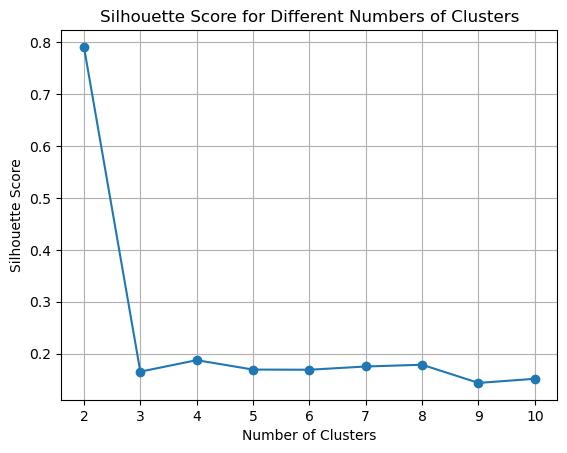

In [38]:
cluster_range = range(2, 11) 

silhouette_scores = []

# Iterate over the cluster range and compute silhouette score for each number of clusters
for n_clusters in cluster_range:
    # Initialize and fit KMeans model
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    cluster_labels = kmeans.fit_predict(X_scaled)
    
    # Compute silhouette score
    silhouette_avg = silhouette_score(X_scaled, cluster_labels)
    silhouette_scores.append(silhouette_avg)

# Find the optimal number of clusters with the highest silhouette score
optimal_n_clusters = cluster_range[np.argmax(silhouette_scores)]
optimal_silhouette_score = max(silhouette_scores)

print(f"Optimal number of clusters: {optimal_n_clusters}")
print(f"Corresponding silhouette score: {optimal_silhouette_score}")
plt.plot(cluster_range, silhouette_scores, marker='o', linestyle='-')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score for Different Numbers of Clusters')
plt.xticks(cluster_range)
plt.grid(True)
plt.show()

In [39]:
agglomerative_clustering = AgglomerativeClustering(n_clusters=2)
cluster_labels = agglomerative_clustering.fit_predict(X_scaled)
yelp_target_sub['cluster_label'] = cluster_labels

yelp_target_sub.head()

,latitude,longitude,stars,review_count,is_open,filtered_categories,city,cluster_label
1,40.291685,-80.104900,3.0,11,1,Beauty & Spas,McMurray,0
8,40.615102,-80.091349,5.0,15,1,Food,Wexford,0
10,40.241548,-80.212815,4.5,3,0,Restaurants,Houston,0
13,40.401488,-79.887916,2.0,5,1,Health & Medical,Homestead,0
44,40.041003,-75.542497,3.5,25,0,Restaurants,Frazer,1


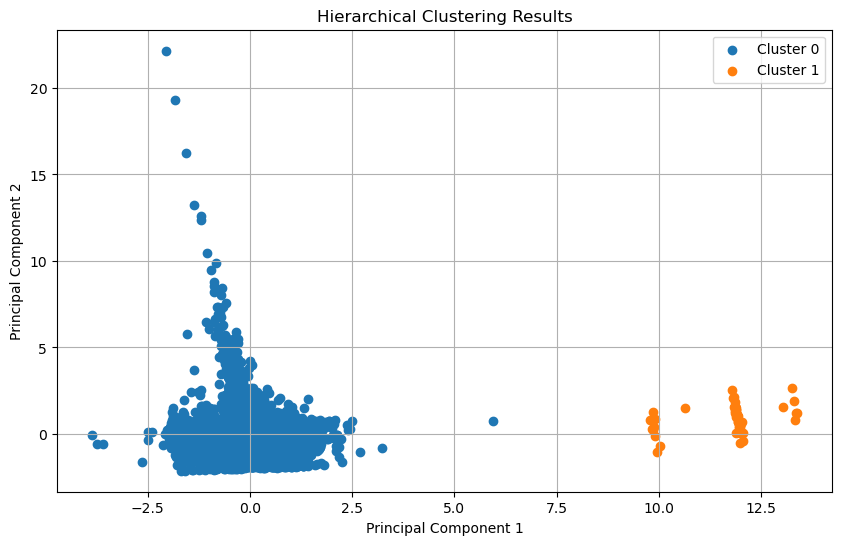

In [40]:
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

plt.figure(figsize=(10, 6))
for cluster_label in np.unique(cluster_labels):
    plt.scatter(X_pca[yelp_target_sub['cluster_label'] == cluster_label, 0],
                X_pca[yelp_target_sub['cluster_label'] == cluster_label, 1],
                label=f'Cluster {cluster_label}')

plt.title('Hierarchical Clustering Results')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend()
plt.grid(True)
plt.show()

In [41]:
# Understanding characteristics of data points within each cluster
for i in range(2):
    cluster_data = yelp_target_sub[yelp_target_sub['cluster_label'] == i]
    print(f"\nCluster {i}:")
    print(cluster_data.describe(include='all'))
    
for i in range(2):
    cluster_data = yelp_target_sub[yelp_target_sub['cluster_label'] == i]
    print(f"\nCluster {i} - Categorical Feature Distribution:")
    print(cluster_data['filtered_categories'].value_counts())
    print(cluster_data['city'].value_counts())



Cluster 0:
            latitude     longitude         stars  review_count       is_open  \
count   10026.000000  10026.000000  10026.000000  10026.000000  10026.000000   
unique           NaN           NaN           NaN           NaN           NaN   
top              NaN           NaN           NaN           NaN           NaN   
freq             NaN           NaN           NaN           NaN           NaN   
mean       40.443944    -79.976571      3.608069     22.793437      0.856673   
std         0.078411      0.137745      0.972472     52.926861      0.350424   
min        39.814763    -80.390082      1.000000      3.000000      0.000000   
25%        40.407720    -80.041832      3.000000      4.000000      1.000000   
50%        40.441770    -79.985104      3.500000      7.000000      1.000000   
75%        40.472508    -79.924867      4.500000     19.000000      1.000000   
max        41.558964    -75.616368      5.000000   1476.000000      1.000000   

       filtered_categories 

Based on the provided data, we have two distinct clusters labeled as Cluster 0 and Cluster 1. Let's analyze each cluster and draw conclusions based on their characteristics:

**Cluster 0 Analysis:**
- **Geographical Distribution:** The businesses in this cluster are primarily located in Pittsburgh, with a few scattered across other areas such as Monroeville, Wexford, Bethel Park, and Bridgeville.
- **Business Categories:** The predominant categories in this cluster are Restaurants, Shopping, and Food establishments, indicating a significant presence of retail and dining options.
- **Business Characteristics:** On average, the businesses in this cluster have a moderate to high rating (mean stars of 3.61) and a relatively higher review count (mean of 22.79). This suggests that these businesses are reasonably well-received and have garnered a notable amount of attention from customers.
- **Business Status:** The majority of businesses in this cluster are open (85.67%).
- **Conclusion:** Cluster 0 represents a diverse range of businesses primarily focused on retail and dining, concentrated mainly in the Pittsburgh area. These businesses generally maintain a good reputation with a considerable customer base.

**Cluster 1 Analysis:**
- **Geographical Distribution:** Businesses in this cluster are concentrated in Frazer, with a few located in Stowe and Nottingham.
- **Business Categories:** Similar to Cluster 0, the main categories here include Restaurants and Shopping, though with fewer establishments overall.
- **Business Characteristics:** The average rating of businesses in this cluster is slightly lower compared to Cluster 0, with a mean star rating of 3.55. The average review count is also lower at 17.13.
- **Business Status:** Similar to Cluster 0, the majority of businesses in this cluster are open (86.67%).
- **Conclusion:** Cluster 1 represents a smaller subset of businesses compared to Cluster 0, with a focus on dining and retail, primarily centered around the Frazer area. While still maintaining a presence, businesses in this cluster might have a slightly lower reputation and attract fewer reviews compared to Cluster 0.

**Overall Conclusion:**
- Both clusters predominantly consist of businesses in the retail and dining sectors, with Cluster 0 being larger and more diverse in terms of geographical distribution and business characteristics.
- Businesses in Cluster 0 generally enjoy a higher average rating and review count compared to those in Cluster 1.
- The analysis suggests that Pittsburgh is a significant hub for businesses in both clusters, with a wide variety of options available to consumers.
- Further investigation could be conducted to understand the factors contributing to the differences in ratings and review counts between the two clusters, potentially aiding in business strategies and decision-making processes.

In [42]:
cluster_colors = {
    0: 'blue',
    1: 'red',
    2: 'green',
}

map_center = [40.443399, -79.982075]  
mymap = folium.Map(location=map_center, zoom_start=10)

marker_cluster = MarkerCluster().add_to(mymap)
for cluster_label in np.unique(yelp_target_sub['cluster_label']):
    cluster_data = yelp_target_sub[yelp_target_sub['cluster_label'] == cluster_label]
    
    for index, row in cluster_data.iterrows():
        lat, lon = row['latitude'], row['longitude']
        color = cluster_colors.get(cluster_label, 'gray')  
        folium.Marker([lat, lon], popup=f"Cluster {cluster_label}", icon=folium.Icon(color=color)).add_to(marker_cluster)
mymap.save("cluster_map.html")
mymap

# 7. Result

In [43]:
for i in range(2):
    cluster_data = yelp_target_sub[yelp_target_sub['cluster_label'] == i]
    print(f"\nCluster {i} - Popular Products or Services:")
    print(cluster_data['filtered_categories'].value_counts().head(3))  # Display top 3 most popular categories

    # Identify gaps in offerings
    all_categories = set(yelp_target_sub['filtered_categories'])
    cluster_categories = set(cluster_data['filtered_categories'])
    missing_categories = all_categories - cluster_categories
    if missing_categories:
        print(f"\nCluster {i} - Missing Products or Services:")
        print(missing_categories)



Cluster 0 - Popular Products or Services:
filtered_categories
Restaurants    3622
Shopping       1564
Food            879
Name: count, dtype: int64

Cluster 1 - Popular Products or Services:
filtered_categories
Restaurants    21
Shopping       12
Food            6
Name: count, dtype: int64

Cluster 1 - Missing Products or Services:
{'Nightlife', 'Financial Services', 'Professional Services', 'Religious Organizations', 'Mass Media', 'Education', 'Local Flavor'}


It's interesting to note that certain categories such as Mass Media, Professional Services, Education, Local Flavor, Religious Organizations, Financial Services, and Nightlife are missing in Cluster 1.
This indicates that these types of businesses or services might not be as prevalent or popular in areas represented by Cluster 1.
It could imply potential market gaps or differences in consumer preferences and needs between Cluster 0 and Cluster 1 regions.
Conclusion:

Cluster 0 areas exhibit a higher concentration of popular categories such as Restaurants, Shopping, and Food, suggesting a vibrant consumer market with a focus on dining out and retail therapy.
Cluster 1 areas, on the other hand, show a lower prevalence of popular categories, indicating potentially quieter or less diverse consumer environments.
The absence of certain categories in Cluster 1 suggests a different demographic or consumer behavior pattern compared to Cluster 0.
Further analysis could delve into demographic data or consumer behavior studies to understand the underlying factors contributing to the observed clustering and differences in popularity across categories.





In [44]:
yelp_target['cluster_label'] = yelp_target_sub['cluster_label']
print(yelp_target.head())

               business_id                        name neighborhood  \
1   He-G7vWjzVUysIKrfNbPUQ       "Stephen Szabo Salon"      Unknown   
8   EsMcGiZaQuG1OOvL9iUFug          "Any Given Sundae"      Unknown   
10  XOSRcvtaKc_Q5H1SAzN20A         "East Coast Coffee"      Unknown   
13  NmZtoE3v8RdSJEczYbMT9g      "Complete Dental Care"      Unknown   
44  BnuzcebyB1AfxH0kjNWqSg  "Carrabba's Italian Grill"      Unknown   

                    address       city state  postal_code   latitude  \
1      "3101 Washington Rd"   McMurray    PA        15317  40.291685   
8   "2612 Brandt School Rd"    Wexford    PA        15090  40.615102   
10       "737 West Pike St"    Houston    PA        15342  40.241548   
13       "107 Whitaker Str"  Homestead    PA        15120  40.401488   
44      "245 Lancaster Ave"     Frazer    PA        19355  40.041003   

    longitude  stars  review_count  is_open filtered_categories  cluster_label  
1  -80.104900    3.0            11        1       Beauty & 

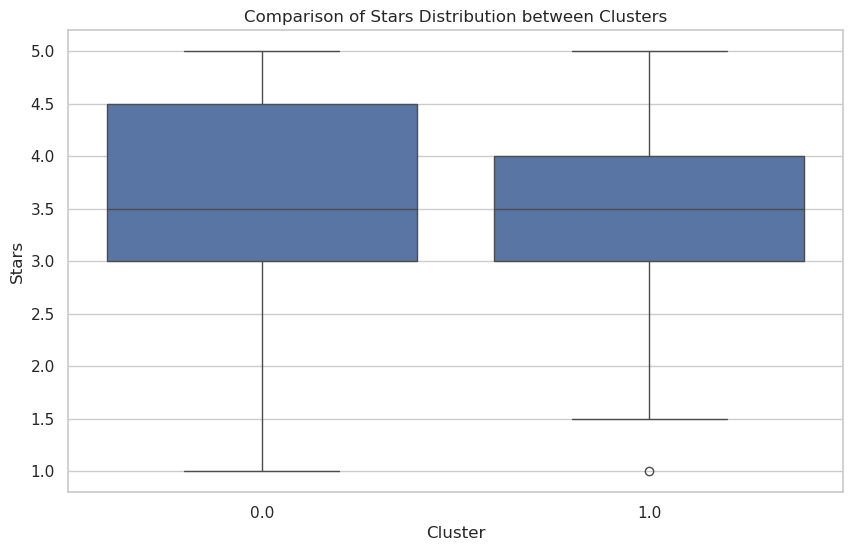

In [45]:
sns.set(style="whitegrid")

plt.figure(figsize=(10, 6))
sns.boxplot(x='cluster_label', y='stars', data=yelp_target)
plt.title('Comparison of Stars Distribution between Clusters')
plt.xlabel('Cluster')
plt.ylabel('Stars')
plt.show()

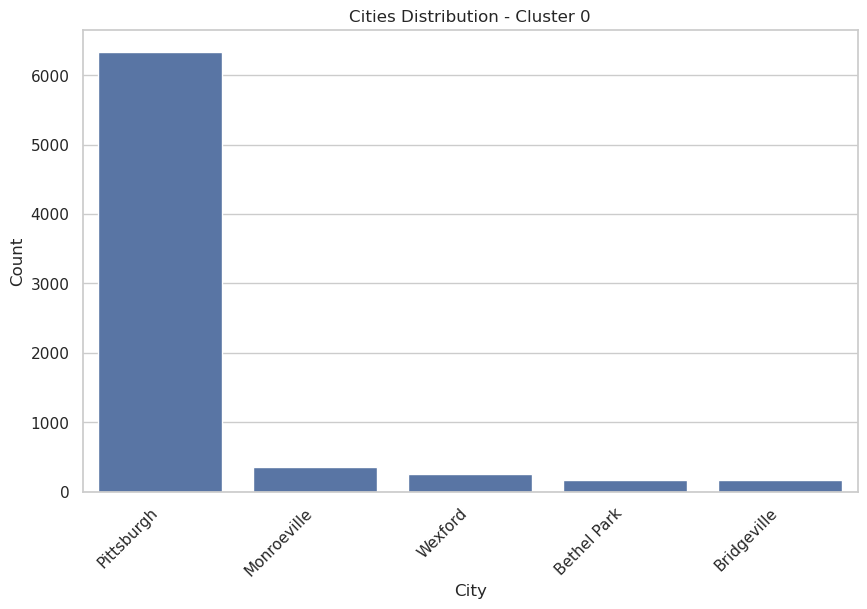

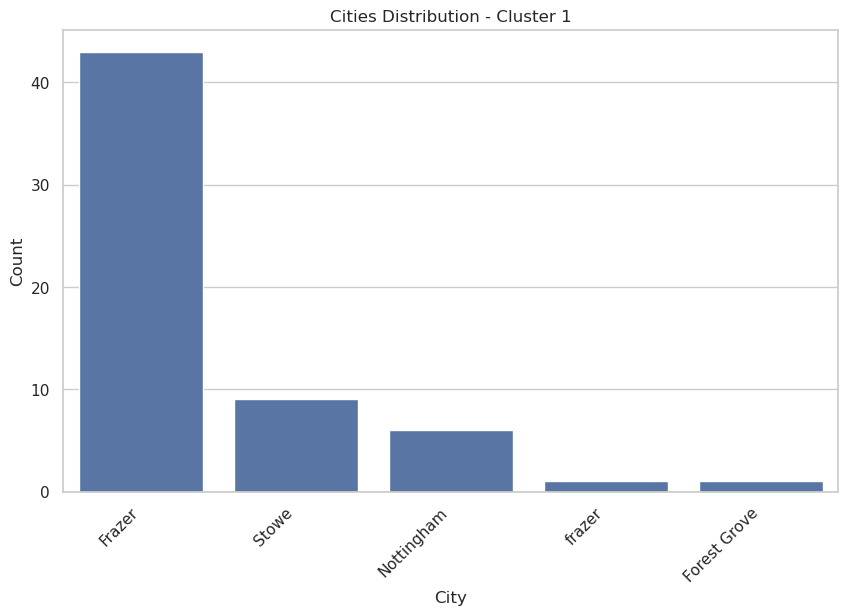

In [46]:
plt.figure(figsize=(10, 6))
sns.countplot(x='city', data=yelp_target[yelp_target['cluster_label'] == 0], order=yelp_target[yelp_target['cluster_label'] == 0]['city'].value_counts().index[:5])
plt.title('Cities Distribution - Cluster 0')
plt.xlabel('City')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right')
plt.show()

plt.figure(figsize=(10, 6))
sns.countplot(x='city', data=yelp_target[yelp_target['cluster_label'] == 1], order=yelp_target[yelp_target['cluster_label'] == 1]['city'].value_counts().index[:5])
plt.title('Cities Distribution - Cluster 1')
plt.xlabel('City')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right')
plt.show()

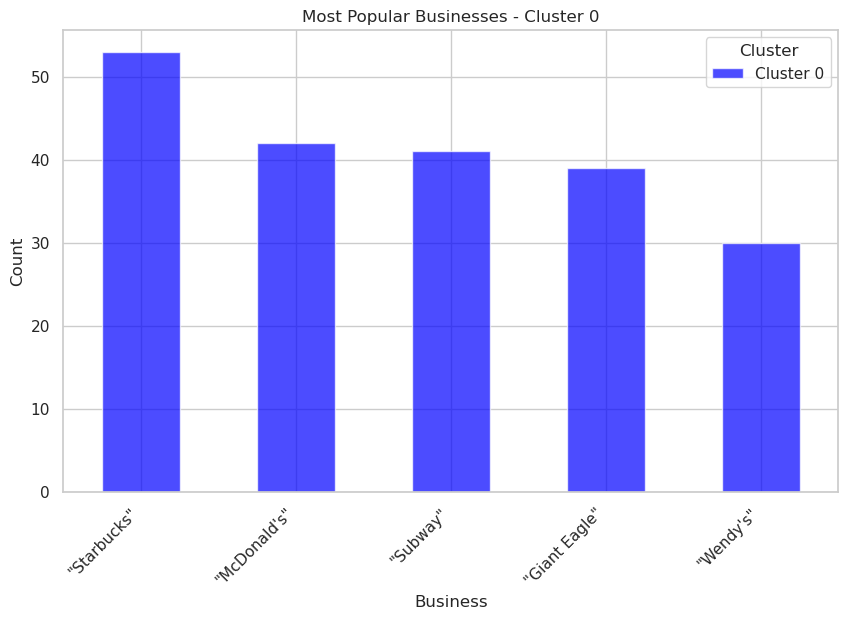

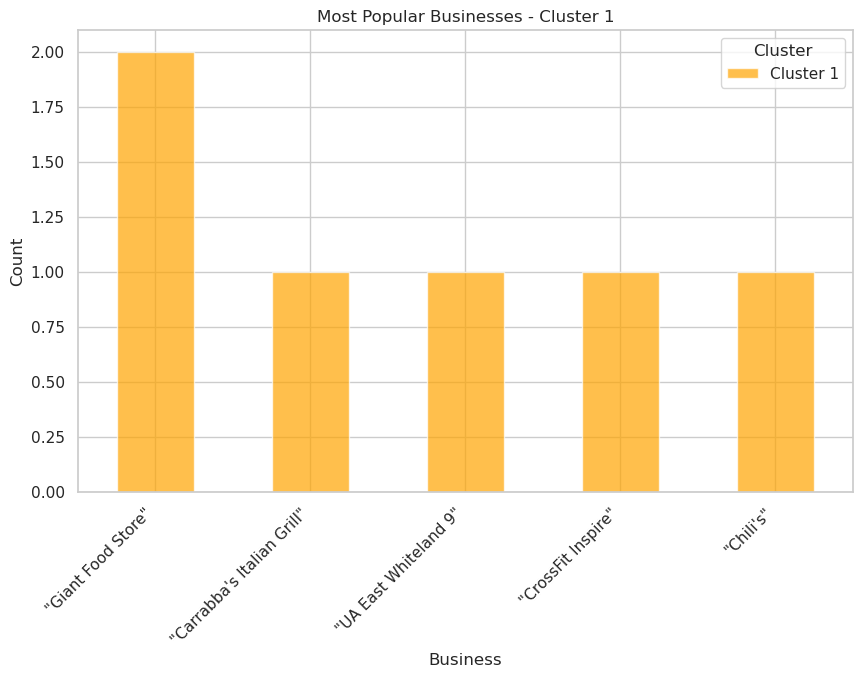

In [47]:
top_businesses_cluster0 = yelp_target[yelp_target['cluster_label'] == 0]['name'].value_counts().head(5)
top_businesses_cluster1 = yelp_target[yelp_target['cluster_label'] == 1]['name'].value_counts().head(5)

plt.figure(figsize=(10, 6))
top_businesses_cluster0.plot(kind='bar', color='blue', alpha=0.7, label='Cluster 0')
plt.title('Most Popular Businesses - Cluster 0')
plt.xlabel('Business')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right')
plt.legend(title='Cluster')
plt.show()

plt.figure(figsize=(10, 6))
top_businesses_cluster1.plot(kind='bar', color='orange', alpha=0.7, label='Cluster 1')
plt.title('Most Popular Businesses - Cluster 1')
plt.xlabel('Business')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right')
plt.legend(title='Cluster')
plt.show()


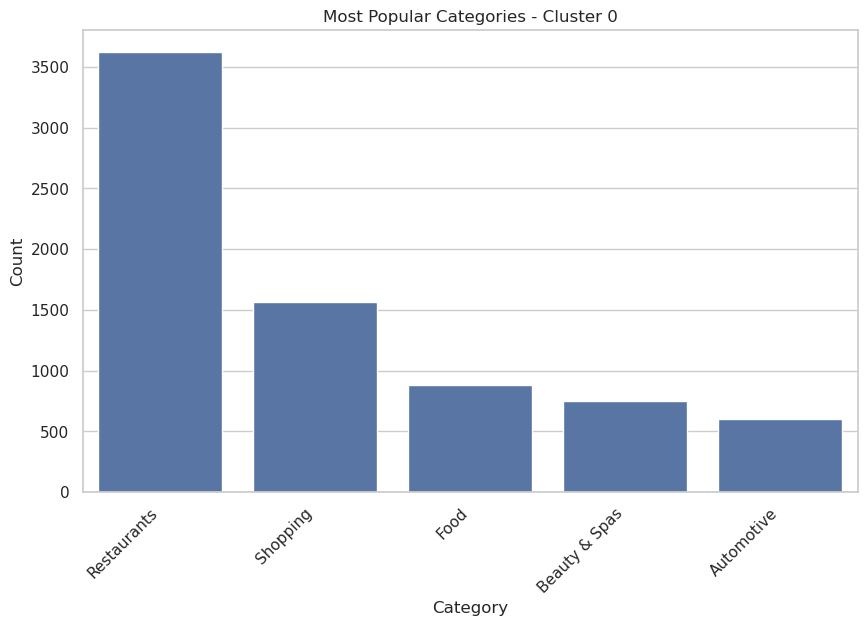

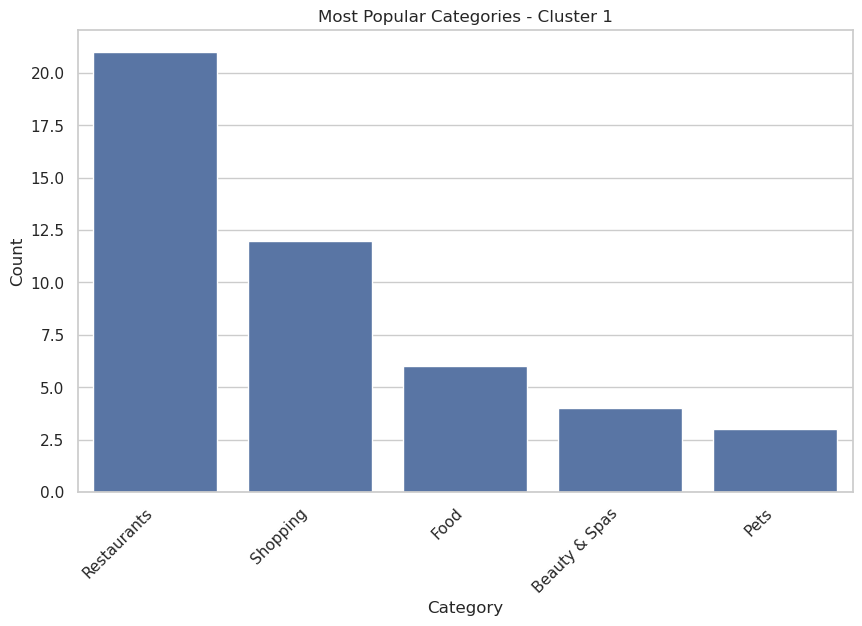

In [48]:
plt.figure(figsize=(10, 6))
sns.countplot(x='filtered_categories', data=yelp_target[yelp_target['cluster_label'] == 0], order=yelp_target[yelp_target['cluster_label'] == 0]['filtered_categories'].value_counts().index[:5])
plt.title('Most Popular Categories - Cluster 0')
plt.xlabel('Category')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right')
plt.show()

plt.figure(figsize=(10, 6))
sns.countplot(x='filtered_categories', data=yelp_target[yelp_target['cluster_label'] == 1], order=yelp_target[yelp_target['cluster_label'] == 1]['filtered_categories'].value_counts().index[:5])
plt.title('Most Popular Categories - Cluster 1')
plt.xlabel('Category')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right')
plt.show()


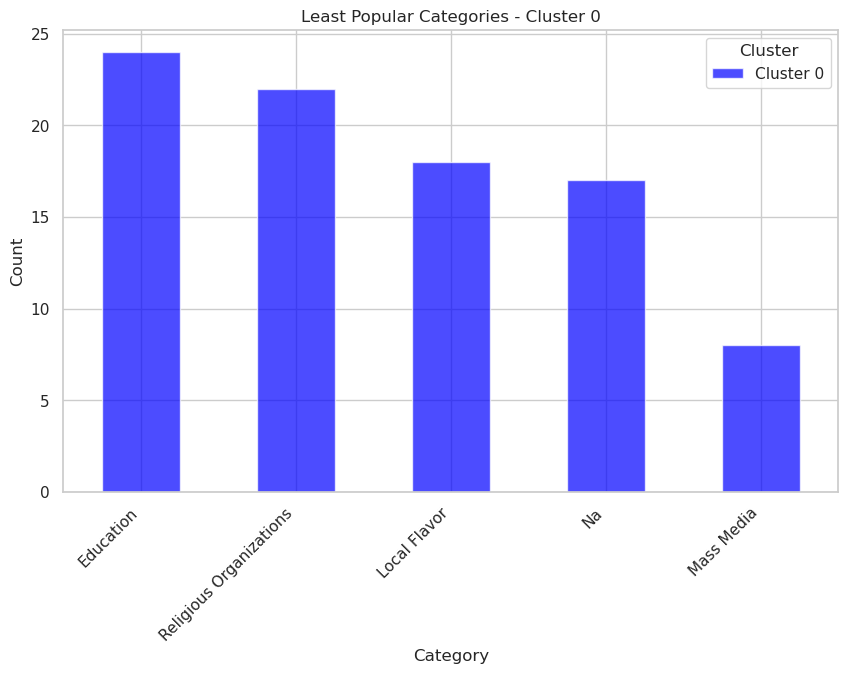

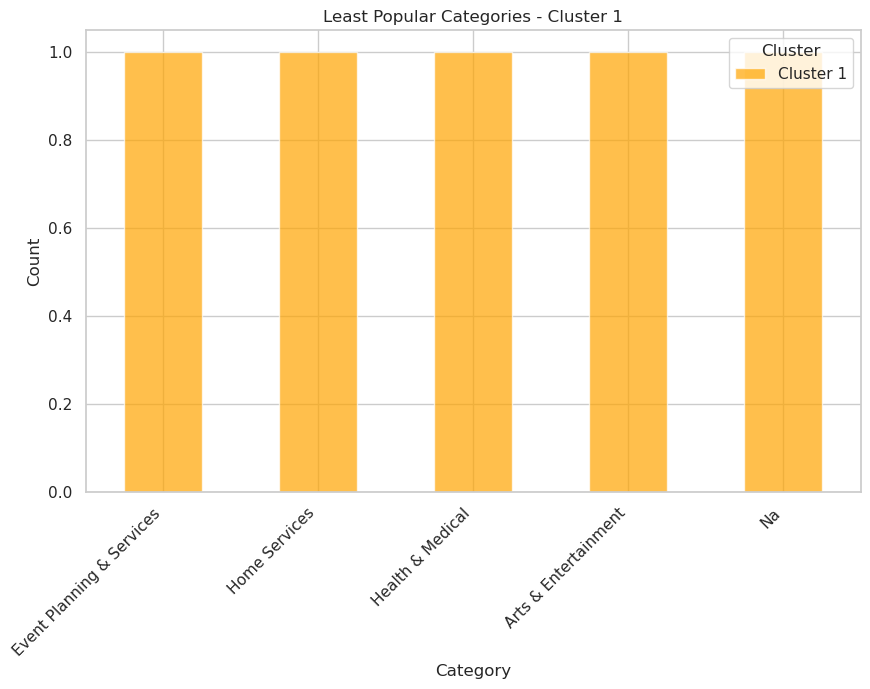

In [49]:
least_popular_categories_cluster0 = yelp_target[yelp_target['cluster_label'] == 0]['filtered_categories'].value_counts().tail(5)
least_popular_categories_cluster1 = yelp_target[yelp_target['cluster_label'] == 1]['filtered_categories'].value_counts().tail(5)

plt.figure(figsize=(10, 6))
least_popular_categories_cluster0.plot(kind='bar', color='blue', alpha=0.7, label='Cluster 0')
plt.title('Least Popular Categories - Cluster 0')
plt.xlabel('Category')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right')
plt.legend(title='Cluster')
plt.show()

plt.figure(figsize=(10, 6))
least_popular_categories_cluster1.plot(kind='bar', color='orange', alpha=0.7, label='Cluster 1')
plt.title('Least Popular Categories - Cluster 1')
plt.xlabel('Category')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right')
plt.legend(title='Cluster')
plt.show()


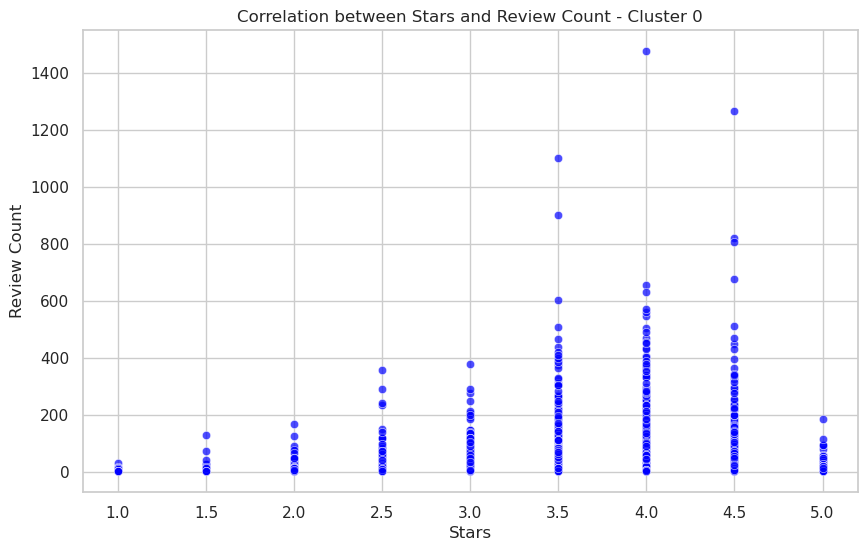

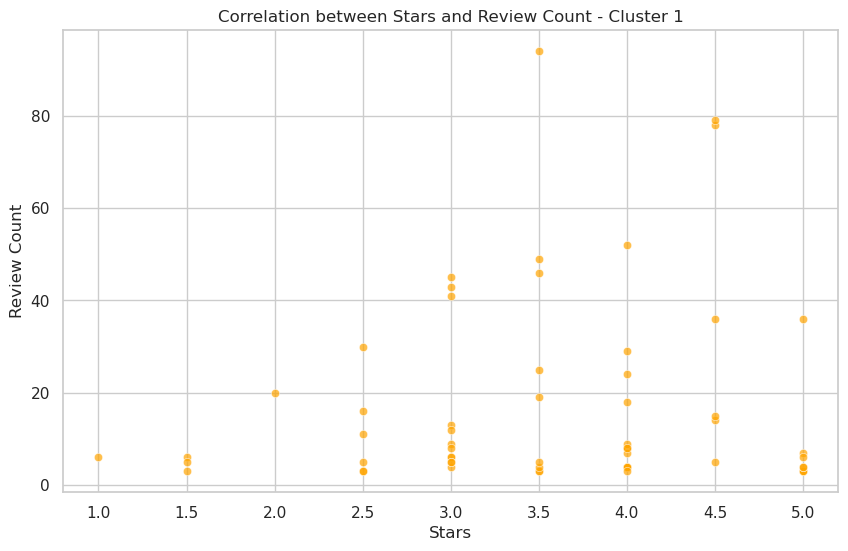

In [50]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x='stars', y='review_count', data=yelp_target[yelp_target['cluster_label'] == 0], color='blue', alpha=0.7)
plt.title('Correlation between Stars and Review Count - Cluster 0')
plt.xlabel('Stars')
plt.ylabel('Review Count')
plt.show()

plt.figure(figsize=(10, 6))
sns.scatterplot(x='stars', y='review_count', data=yelp_target[yelp_target['cluster_label'] == 1], color='orange', alpha=0.7)
plt.title('Correlation between Stars and Review Count - Cluster 1')
plt.xlabel('Stars')
plt.ylabel('Review Count')
plt.show()